# UMAPs, growth rates and pulls of E8.0 --> E.25

In [1]:
import numpy as np
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from moscot.problems.time._lineage import TemporalProblem

#sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(11,6)})

import mplscience

mplscience.set_style(reset_current=True)
plt.rcParams['figure.dpi'] = 200

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [2]:
Path="/home/mgander/moscot-framework_reproducibility/data/mouse_temporal"
ts=['E3.5', 'E4.5', 'E5.25', 'E5.5', 'E6.25', 'E6.5', 'E6.75', 'E7.0', 'E7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25', 'E8.5a', 'E8.5b', 'E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5']
# Doesn't matter which adata you use to create a tp instance, the result is always the same. I just need one
# to instantiate a tp-problem
adata=sc.read(f"{Path}/anndatas/Comb_anndatas/adata_E3.5_E4.5.h5ad")
tp=TemporalProblem(adata)

cells=[32, 80, 100, 120, 400, 660, 1720, 4500, 8200, 15000, 30000, 60000, 73000, 90000, 90000, 200000, 1100000, 2600000, 6000000, 13000000]
Cell_number_dict={}
for i in range(20):
    Cell_number_dict[ts[i]]=cells[i]

Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].


# Load anndatas and maps

In [34]:
i=11

ts0=ts[i]
print(ts0)
ts1=ts[i+1]

E8.0


In [35]:
tp=tp.load(f'{Path}/moscot_maps/{ts0}_{ts1}_no_gr2_TemporalProblem.pkl')
adata=tp.adata

In [36]:
time_tuple=list(tp.solutions.keys())[0]
gr=tp[time_tuple].solution.a
gr=gr/gr.mean()*Cell_number_dict[ts1]/Cell_number_dict[ts0]

In [37]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pcaS')

In [40]:
sc.tl.umap(adata, random_state=1)

#U0=adata.obsm['X_umap'][:,0].copy()
#U1=adata.obsm['X_umap'][:,1].copy()
#adata.obsm['X_umap'][:,0]=-U0
#adata.obsm['X_umap'][:,1]=U1

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


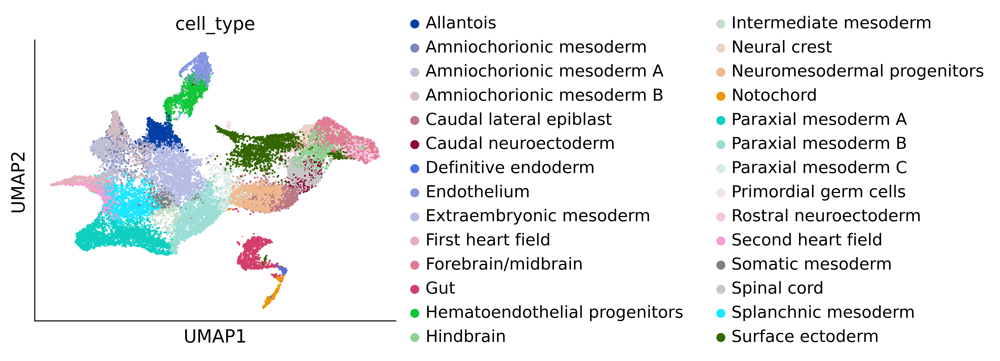

In [41]:
#rs 1
sc.pl.umap(adata, color='cell_type', size=10)

In [42]:
# Add growth rates and pull to A0
A0=adata[adata.obs['day']==8].copy()

A0.obs['gr_m']=gr
A0.obs['gr_t']=np.load(f'{Path}/TOME_transport_maps/{ts0}_growth_rates2.npy')

sc.pp.scale(A0)
cc_genes_mouse=list(pd.read_csv(f'{Path}/utils/mouse_proliferation.txt', header=None)[0])
sc.tl.score_genes(A0, cc_genes_mouse)
A0.obs['gr_cc']=A0.obs['score']

In [43]:
ct='E8.25:First heart field'
A0.obs['fhf_m']=np.load(f"{Path}/moscot_maps/{ts0}_{ct}_pull2.npy", allow_pickle=True)
A0.obs['fhf_t']=np.load(f"{Path}/TOME_transport_maps/{ts0}_{ct}_pull2.npy", allow_pickle=True)

# Plot growth rates

In [44]:
# Only k biggest cell types
cts=list(A0.obs.value_counts('cell_type').index)[:5]
A0s=A0[A0.obs['cell_type'].isin(cts)].copy()

In [45]:
A0.obs.value_counts('cell_type')

cell_type
Rostral neuroectoderm            1730
Paraxial mesoderm B              1116
Caudal lateral epiblast          1111
Paraxial mesoderm A               991
Amniochorionic mesoderm           923
Splanchnic mesoderm               890
Extraembryonic mesoderm           887
Surface ectoderm                  687
Hematoendothelial progenitors     606
Caudal neuroectoderm              555
Paraxial mesoderm C               453
Allantois                         439
Gut                               399
Endothelium                       168
Notochord                         158
Spinal cord                       150
Intermediate mesoderm             121
Somatic mesoderm                  102
First heart field                  95
Primordial germ cells              52
Definitive endoderm                41
Name: count, dtype: int64

<Figure size 2000x1600 with 0 Axes>

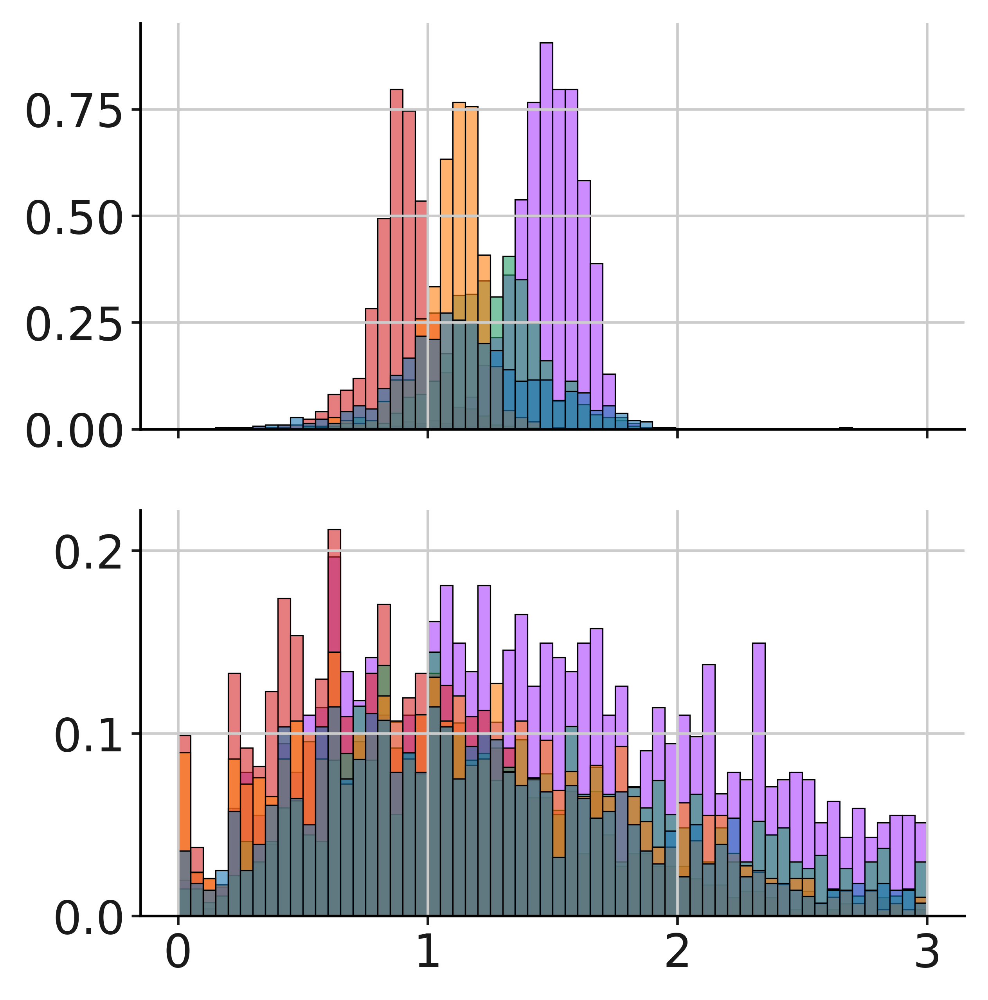

In [46]:
alpha=0.6

ns=61

plt.figure(figsize = [10, 8], dpi=200)

fig, axs = plt.subplots(2, 1, figsize=(4.5, 5))

g0=sns.histplot(ax=axs[0], data=A0s.obs, x='gr_m', hue='cell_type', bins=np.linspace(0,3,ns), 
             alpha=0.6, legend=False, stat='density')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.histplot(ax=axs[1], data=A0s.obs, x='gr_t', hue='cell_type', bins=np.linspace(0,3,ns), 
             alpha=0.6, legend=False, stat='density')
g1.set(xlabel=None)
g1.set(ylabel=None)
plt.show()

In [188]:
plt.figure(figsize = [10, 8], dpi=200)

xlim=4

fig, axs = plt.subplots(4, 1, figsize=(4.5, 5))

g0=sns.boxplot(ax=axs[0], data=A0s.obs, x='gr_init', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)


g0=sns.boxplot(ax=axs[1], data=A0s.obs, x='gr_m2', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g0=sns.boxplot(ax=axs[2], data=A0s.obs, x='gr_m', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.boxplot(ax=axs[3], data=A0s.obs, x='gr_t', y='cell_type')
g1.set(xlabel=None)
g1.set(ylabel=None)


axs[0].set_xlim(0, xlim)
axs[1].set_xlim(0, xlim)
axs[2].set_xlim(0, xlim)
axs[3].set_xlim(0, xlim)

plt.show()

ValueError: Could not interpret input 'gr_init'

In [ ]:
# Only k biggest cell types
cts=list(A0.obs.value_counts('cell_type').index)[:10]
A0s=A0[A0.obs['cell_type'].isin(cts)].copy()

In [ ]:
g1=sns.boxplot(data=A0s.obs, x='gr_init', y='cell_type')

In [ ]:
plt.figure(figsize = [10, 8], dpi=200)

xlim=4

fig, axs = plt.subplots(1, 4, figsize=(4.5, 5))

g0=sns.violinplot(ax=axs[0], data=A0s.obs, y='gr_init', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)


g0=sns.violinplot(ax=axs[1], data=A0s.obs, y='gr_m2', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g0=sns.violinplot(ax=axs[2], data=A0s.obs, y='gr_m', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.violinplot(ax=axs[3], data=A0s.obs, y='gr_t', x='cell_type')
g1.set(xlabel=None)
g1.set(ylabel=None)


#axs[0].set_xlim(0, xlim)
#axs[1].set_xlim(0, xlim)
#axs[2].set_xlim(0, xlim)
#axs[3].set_xlim(0, xlim)

plt.show()

# Visualize UMAPs

In [47]:
palette=pd.read_csv(f'{Path}/utils/umap_basic_colormap.txt').values
palette=[palette[i,:]/255 for i in range(len(palette))]
palette[1]=np.array([120,173,210])/255
palette[2]=np.array([255,178,110])/255
palette[4]=palette[7].copy()
palette[7]=np.array([142,6,59])/255
palette[9]=np.array([28,230,255])/255
palette[11]=np.array([213,234,231])/255
palette[12]=np.array([128,198,128])/255
palette[13]=np.array([230,125,126])/255
palette[15]=np.array([127,127,127])/255
palette[16]=np.array([190,164,215])/255
palette[19]=np.array([51,102,0])/255
palette[20]=np.array([187,119,13])/255
palette[21]=np.array([199,199,199])/255

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


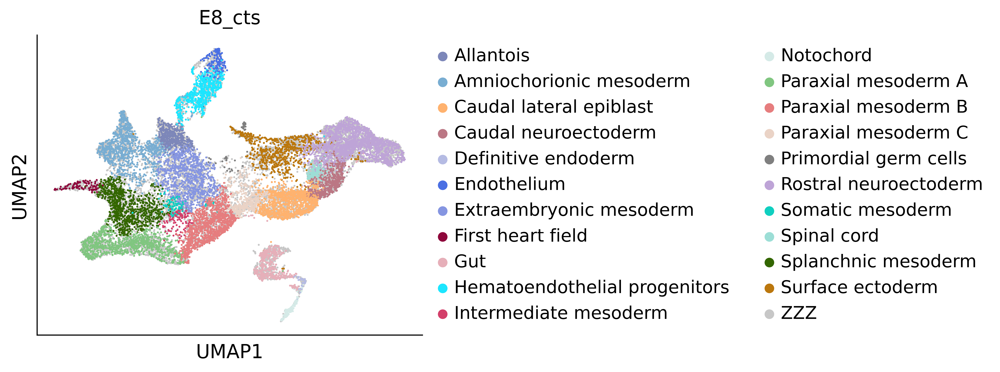

In [48]:
# Resort to put E8.25 to the back

adata.obs['E8_cts']=[a[3:] if a[:3]!='E8.' else 'ZZZ' for a in adata.obs['cell_state']]
a0i=adata[adata.obs['day']==8].obs.index
a1i=adata[adata.obs['day']==8.25].obs.index
adata=adata[[*a1i, *a0i],:].copy()
sc.pl.umap(adata, color='E8_cts', size=8, palette=palette)

In [49]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=300, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

# The legend

In [50]:
cell_types=sorted(set(adata.obs['E8_cts']))

selected_cell_types=cts

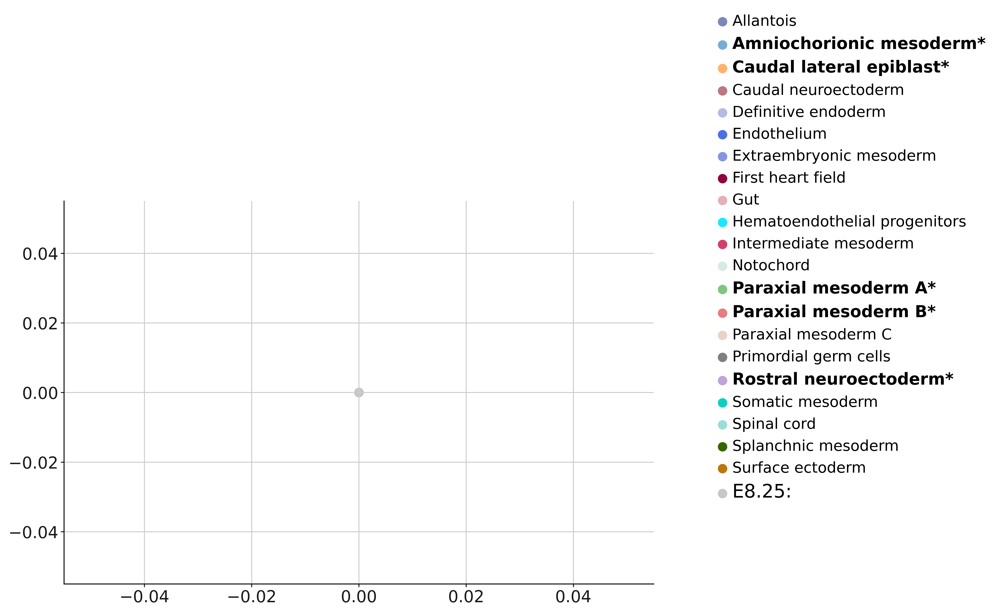

In [51]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=300)
for i in range(len(cell_types)):
    ct=cell_types[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
    if cell_type=='ZZZ':
        text.set_fontsize(16)
        text.set_text("E8.25:")
        
    if cell_type in selected_cell_types:
        text.set_text(cell_type+'*')
        text.set_fontweight("bold")
        text.set_fontsize(14)
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

# Growth rate umaps

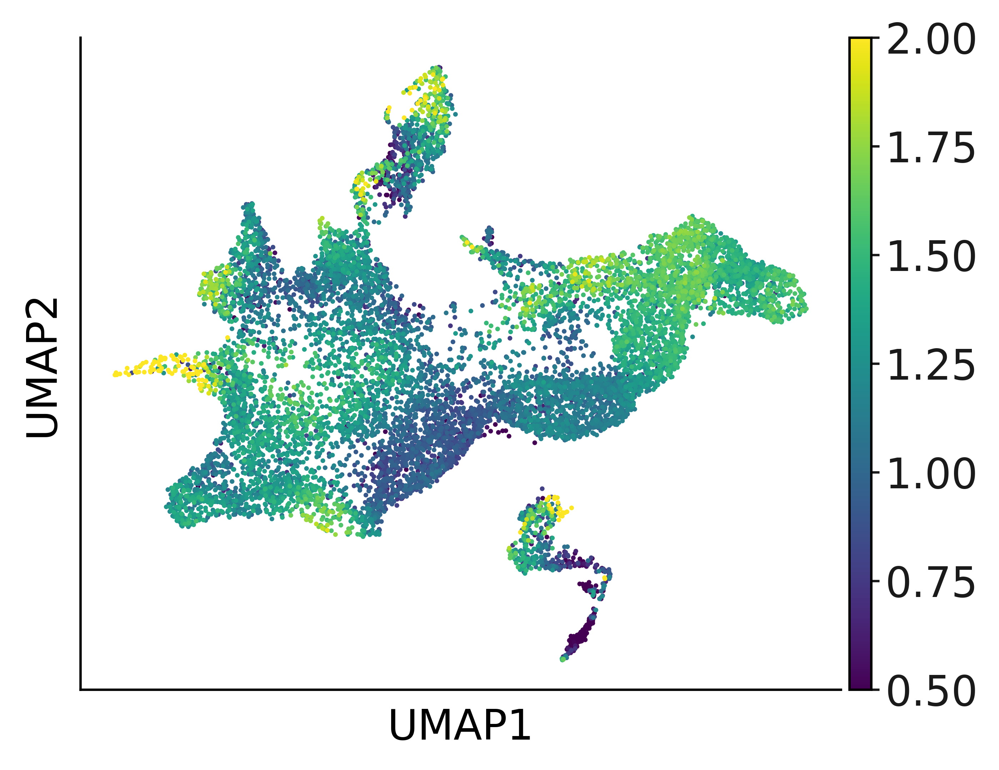

In [54]:
perc=99.9

sc.pl.umap(A0, color='gr_m', title='', vmin=0.5, vmax=2, size=10, legend_fontsize=10)

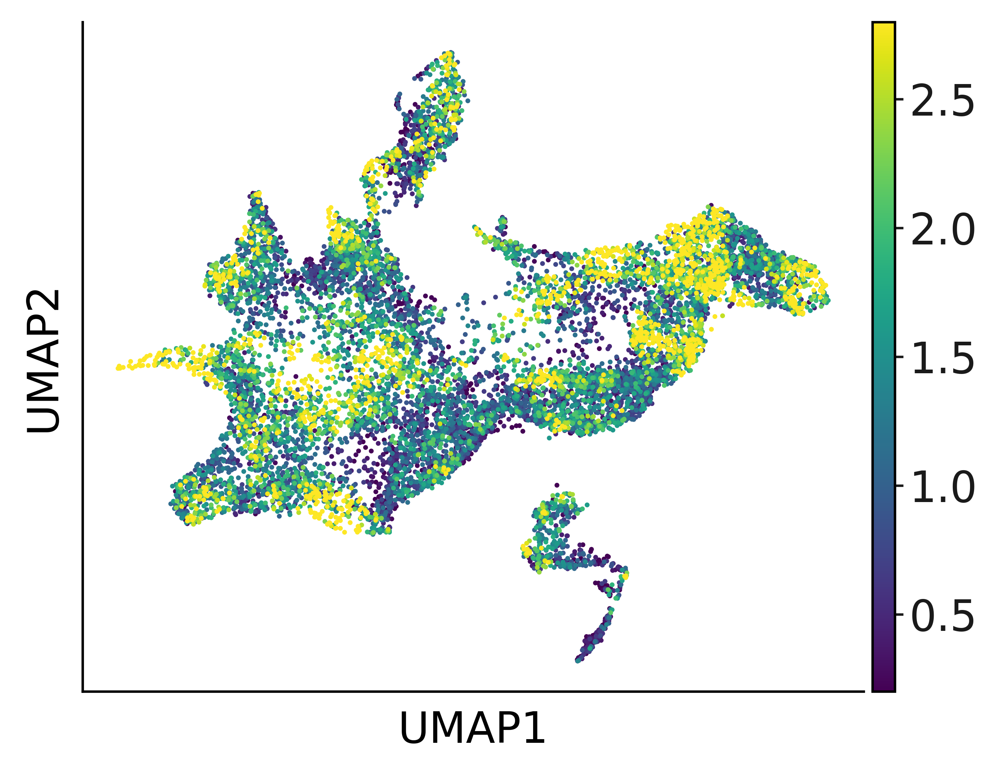

In [61]:
sc.pl.umap(A0, color='gr_t', title='', vmin=0.2, vmax=2.8, size=10, legend_fontsize=10)

# Pull Umaps

In [62]:
palette2=[(51,102,0),
(142,6,59),
(199,199,199)]
palette2=[np.array(a)/255 for a in palette2]

In [65]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=400, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


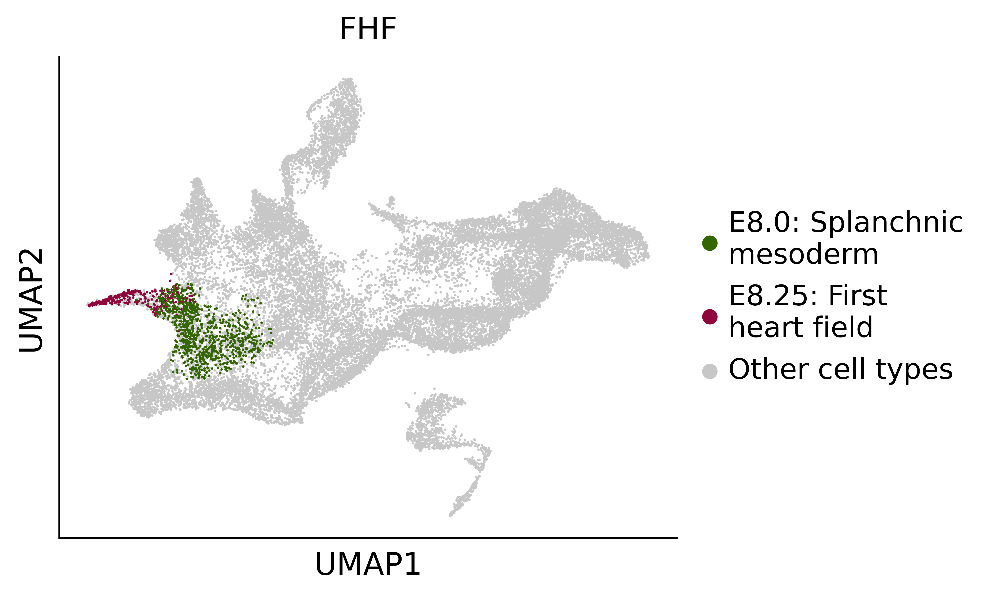

In [66]:
# Resort to put E8.25 to the back, and only color splanchnic mesoderm and first heart field

lst=[a if a in ['E8:Splanchnic mesoderm', 'E8.25:First heart field']  else 'Other cell types' for a in adata.obs['cell_state']]
lst=[a if a!='E8.25:First heart field' else 'E8.25: First \nheart field' for a in lst]
lst=[a if a!='E8:Splanchnic mesoderm' else 'E8.0: Splanchnic \nmesoderm' for a in lst]
adata.obs['FHF']=lst
a0i=adata[adata.obs['FHF']!='Other cell types'].obs.index
a1i=adata[adata.obs['FHF']=='Other cell types'].obs.index
adata=adata[[*a1i, *a0i],:].copy()
sc.pl.umap(adata, color='FHF', size=5, palette=palette2)

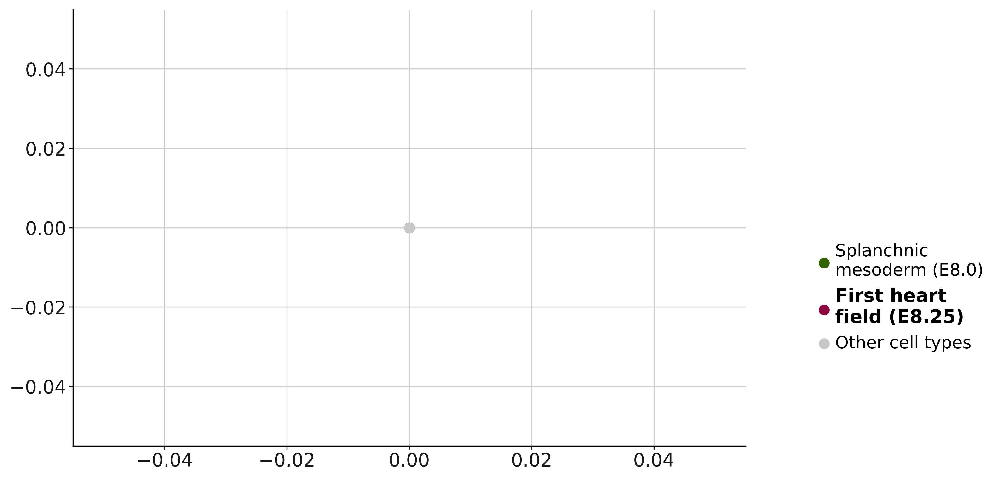

In [68]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)

ct_fhf=['Splanchnic \nmesoderm (E8.0)', 'First heart \nfield (E8.25)', 'Other cell types']
for i in range(3):
    ct=ct_fhf[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette2[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
l=0
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
        
    if l==1:
        text.set_fontweight("bold")
        text.set_fontsize(14)
    l+=1
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

In [69]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

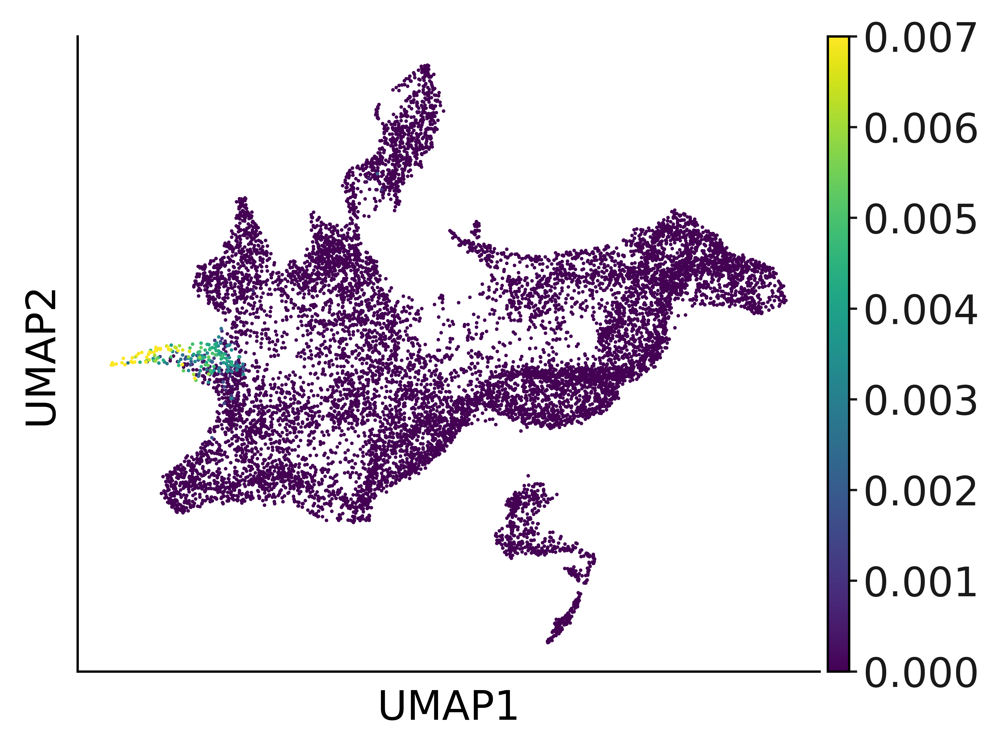

In [78]:
sc.pl.umap(A0, color='fhf_m', title='', vmax=0.007, size=6, legend_fontsize=10)

# Umaps for gene correlation

In [79]:
A0S=sc.read(f"{Path}/anndatas/scVI_anndatas/scvi_adata_{ts0}.h5ad")
A0S.var.index=list(A0S.var['gene_names'])

In [80]:
A0S=A0S[A0.obs.index]

In [81]:
drivers=['Irx4', 'Tnnt2', 'Tbx20']

for d in drivers:
    loc=A0S.var.index.get_loc(d)
    
    A0.obs[d+'_pl']=list(A0S.layers['scvi_normalized'][:,loc])
A0.obs.columns=list(A0.obs.columns)

In [82]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=False, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

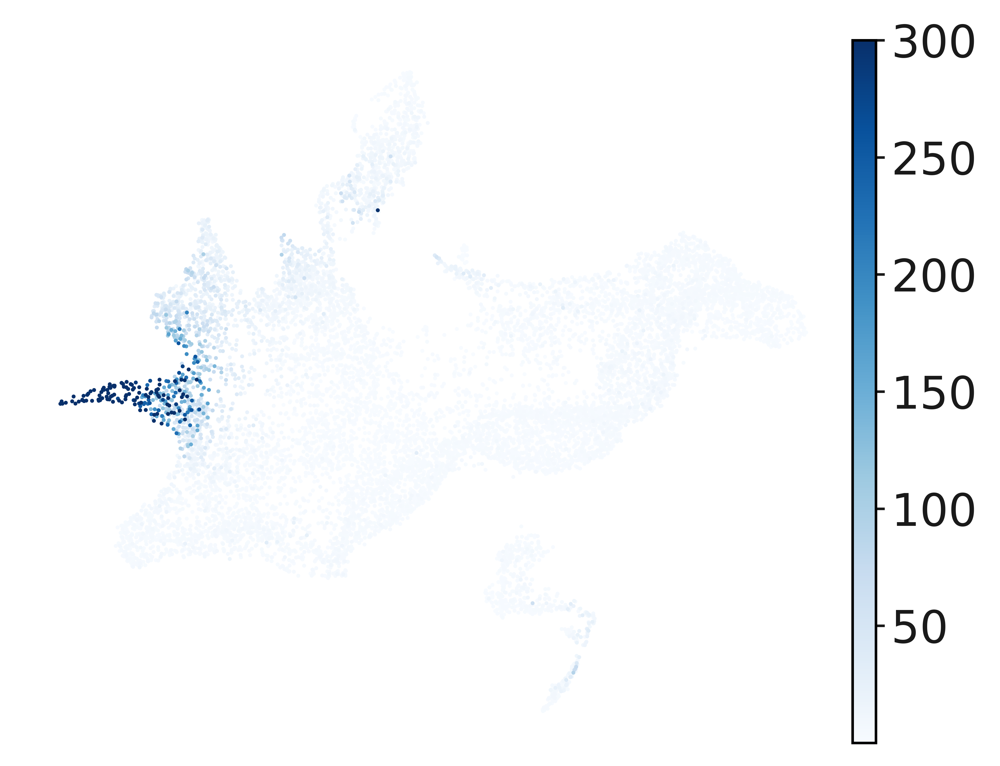

In [84]:
sc.pl.umap(A0, color='Tnnt2'+'_pl', title='', color_map='Blues', size=6, vmax=300, legend_loc=(0,0))

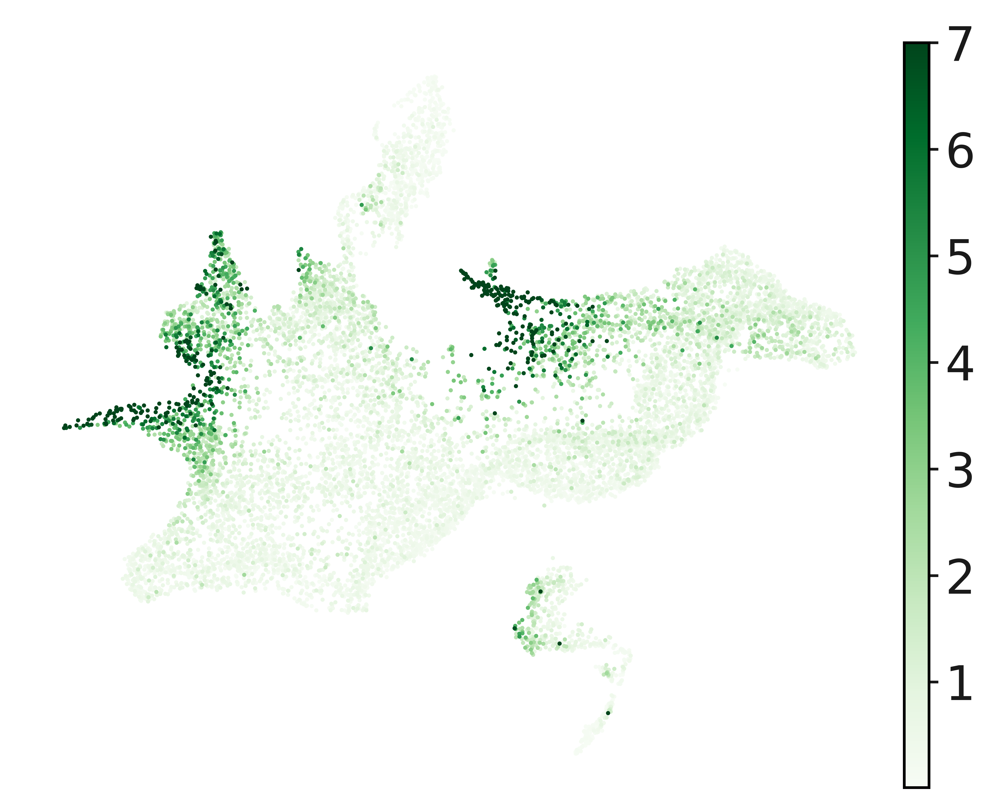

In [85]:
sc.pl.umap(A0, color='Irx4'+'_pl', title='', color_map='Greens', size=6, vmax=7, legend_loc=(0,0))

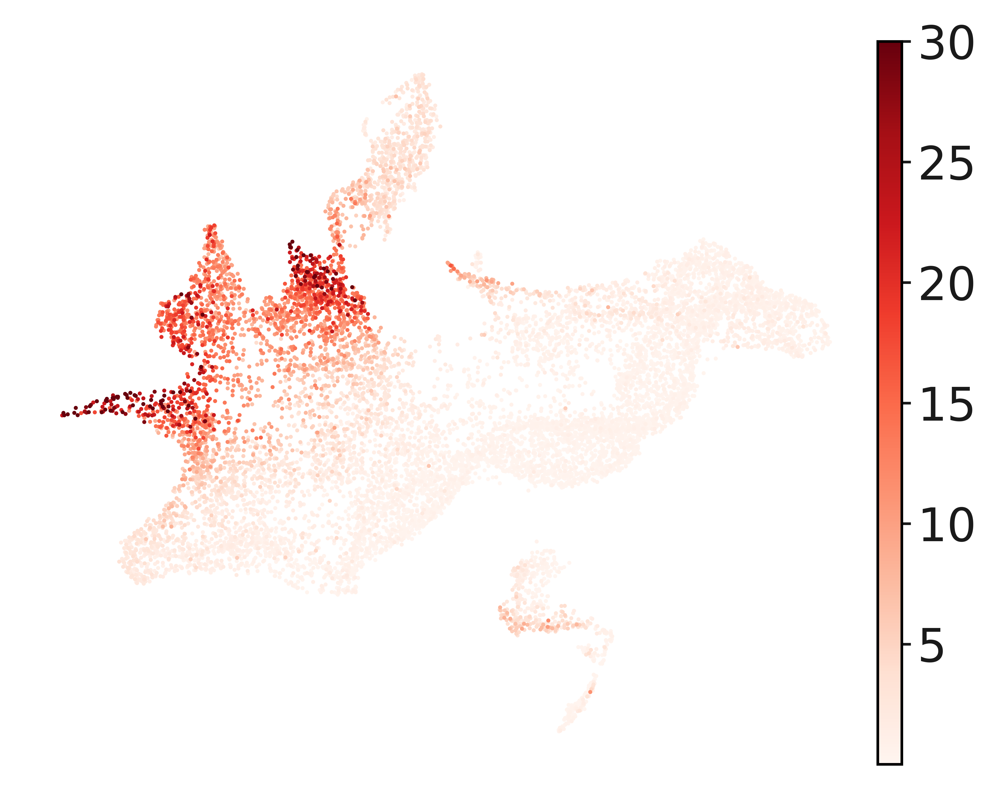

In [86]:
sc.pl.umap(A0, color='Tbx20'+'_pl', title='', color_map='Reds', size=6, vmax=30, legend_loc=(0,0))

In [87]:
def col_map(v):
    r,g,b=v
    cdict2 = {'red':   [(0.0,  0, 0),
                       (1.0,  r,0)],
             'green': [(0.0,  0, 0),
                      (1.0,  g, 0)],
             'blue':  [(0.0,  0, 0.0),
                      (1.0,  b, 0)]} 
    my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap2',cdict2,256)
    return(my_cmap)

In [88]:
def plt_cmap(cmap):
    plt.figure()
    a=np.outer(np.arange(0,1,0.01),np.ones(100))
    plt.imshow(a,aspect='auto', cmap =cmap)                   
    plt.show()

In [89]:
def col_dict(genes, k=-2):
    if gene=='Tnnt2':
        col=sns.color_palette('Blues')[k]
    elif gene=='Cdkn1c':
        col=sns.color_palette('Blues')[k]
    elif gene=='Bmp2':
        col=sns.color_palette('Greens')[k]
    elif gene=='Irx4':
        col=sns.color_palette('Greens')[k]
    elif gene=='Tbx20':
        col=sns.color_palette('Reds')[k]
    return(col)

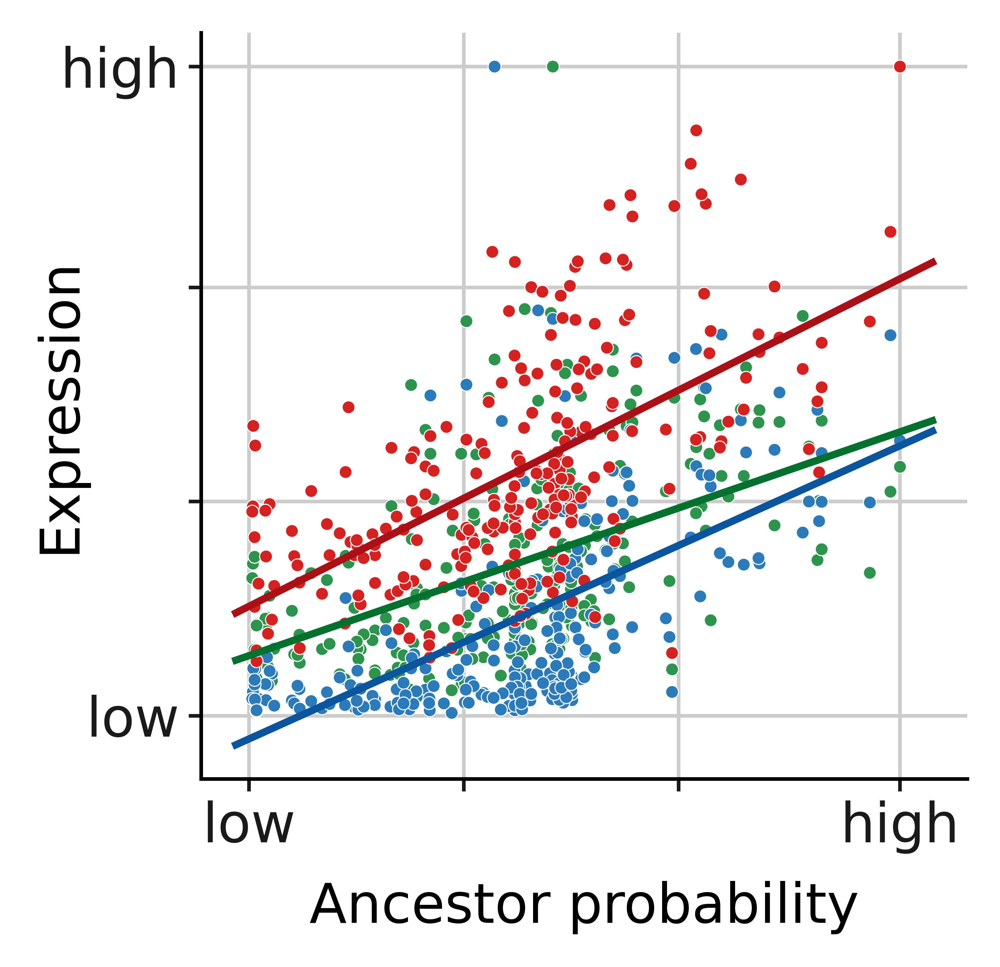

In [90]:
fontsize=12

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(3, 3))

#for gene in ['Tnnt2', 'Tbx20', 'Cdkn1c', 'Bmp2', 'Ccdc141']:
for gene in ['Irx4', 'Tnnt2', 'Tbx20']:

    ms=0.9
    cut=0.005
    
    loc=A0S.var.index.get_loc(gene)
    exp=A0S.layers['scvi_normalized'][:,loc]

    wh=np.where(A0S.obs['cell_state'].isin(['E8:Splanchnic mesoderm', 'E8:First heart field']))[0]
    exp=A0.obs[gene+'_pl'][wh]
    
    # sqrt to make plot look better. Doesn't matter mathematically, since we use spearman-correlation
    gM2=np.sqrt(A0.obs['fhf_m'][wh])
    
    gM2=gM2/gM2.max()
    exp=exp/exp.max()
    
    wh=np.where(gM2>cut)[0]
    
    gM3=gM2[wh]
    exp=exp[wh]
    
    exp=exp/exp.max()
    
    col=col_dict(gene)

    sns.scatterplot(x=gM3, y=exp, color=col, s=8, zorder=2)
    
    a,b=np.polyfit(gM3, exp, 1)
    
    
    def lin(xs,a,b):
        l=[]
        for x in xs:
            l.append(b+a*x)
        return(l)

    xs=np.linspace(-0.02,1.05,101)
    y=lin(xs,a,b)
    
    plt.plot(xs, y, linewidth=1.6, color=col_dict(gene, k=-1), zorder=3)

    ax.set_ylabel(ylabel='Expression', fontsize=fontsize)
    plt.yticks([0,0.33,0.66,1])
    ax.set_yticklabels(labels=['low', '','', 'high'],fontsize=fontsize)

    ax.set_xlabel(xlabel='Ancestor probability', fontsize=fontsize)
    plt.xticks([0,0.33,.66,1])
    ax.set_xticklabels(labels=['low', '', '', 'high'],fontsize=fontsize)

    ax.yaxis.set_label_coords(-0.15, 0.5)
plt.show()